### Kevin Ahmadiputra | TP058396 | CNN Model

In [1]:
#INSTALL REQUIRED PACKAGES AND LIBRARIES
# !pip install opencv-python
# !pip install matplotlib
# !pip install scikit-learn
# !pip install seaborn

In [2]:
#IMPORT LIBRARIES
import tensorflow as tf
import seaborn as sns
import numpy as np
import pandas as pd
import os
import imghdr
import cv2
from matplotlib import pyplot as plt
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from tensorflow.keras.metrics import Precision, Recall, Accuracy
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout, BatchNormalization
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.resnet50 import ResNet50

In [3]:
#PARAMETERS
b_size = 32
img_height = 256
img_width = 256
img_size = (img_height, img_width)
epochs = 40
train_size = 0.8
val_size =0.1
test_size = 0.1

#Data Directory
model_dir = 'models'
data_dir_fruit ='FYP_DATASET\\fruit'
data_dir_segment = 'FYP_DATASET\\fruit-segmented'
fruit_logdir = 'CNN_Logs\\Logs_Fruit'

cnn_fruit = 'CNN-FRUIT.h5'
cnn_fruit_cp ="CNN-FRUIT-Epoch-{epoch:02d}.h5"

cnn_fruit_vgg16 = 'CNN-FRUIT-VGG16.h5'
cnn_fruit_vgg16_cp ="CNN-FRUIT-VGG16-Epoch-{epoch:02d}.h5"

cnn_fruit_res50 = 'CNN-FRUIT-RESNET50.h5'
cnn_fruit_res50_cp ="CNN-FRUIT-RESNET50-Epoch-{epoch:02d}.h5"

#Image Extension
img_extend = ['jpg', 'jpeg', 'png']

In [4]:
#Avoid OOM Erros by Setting CPU Memory Consumption Growth
gpus = tf.config.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)
gpus

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [5]:
#List all folder in data_dir with name Fruits
fruit_list = os.listdir(data_dir_fruit)
fruit_num = len(fruit_list)

print("FRUIT\nNumber of Classes = ", fruit_num)
cnt = 0
for i in fruit_list:
    print(cnt, "-->", i)
    cnt = cnt + 1

FRUIT
Number of Classes =  6
0 --> Fruits_apple_fresh
1 --> Fruits_apple_rotten
2 --> Fruits_banana_fresh
3 --> Fruits_banana_rotten
4 --> Fruits_orange_fresh
5 --> Fruits_orange_rotten


In [6]:
#Count Image per Class
print("FRUIT - Images")    
for i in fruit_list:
    img_cnt = 0
    for j in os.listdir(os.path.join(data_dir_fruit,i)):
        if imghdr.what(os.path.join(data_dir_fruit,i,j)) in img_extend:
            img_cnt += 1
    print(i,'--->',img_cnt)

FRUIT - Images
Fruits_apple_fresh ---> 2687
Fruits_apple_rotten ---> 3463
Fruits_banana_fresh ---> 2659
Fruits_banana_rotten ---> 3311
Fruits_orange_fresh ---> 2598
Fruits_orange_rotten ---> 2754


## 1.0 Pre-Processing

#### Image Segmentation (GrabCut)

In [11]:
for i in fruit_list:
    for j in os.listdir(os.path.join(data_dir_segment,i)):
        if imghdr.what(os.path.join(data_dir_segment,i,j)) in img_extend:
            filename = os.path.join(data_dir_segment,i,j)
            image = cv2.imread(filename)
            image = cv2.resize(image, (256, 256))
            # Create a mask to specify which areas are background, foreground, etc.
            mask = np.zeros(image.shape[:2], np.uint8)

            # Define the rectangle encompassing the foreground object (in this case, the leaf)
            rectangle = (2, 2, 251, 251)  # (x, y, width, height)

            # Apply GrabCut algorithm
            bgd_model = np.zeros((1, 65), np.float64)
            fgd_model = np.zeros((1, 65), np.float64)
            cv2.grabCut(image, mask, rectangle, bgd_model, fgd_model, 5, cv2.GC_INIT_WITH_RECT)

            # Create a mask that labels the foreground and probable foreground regions as likely foreground
            foreground_mask = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')

            # Apply the mask to the original image to remove the background
            segmented_image = image * foreground_mask[:, :, np.newaxis]
            
            cv2.imwrite(filename, segmented_image)

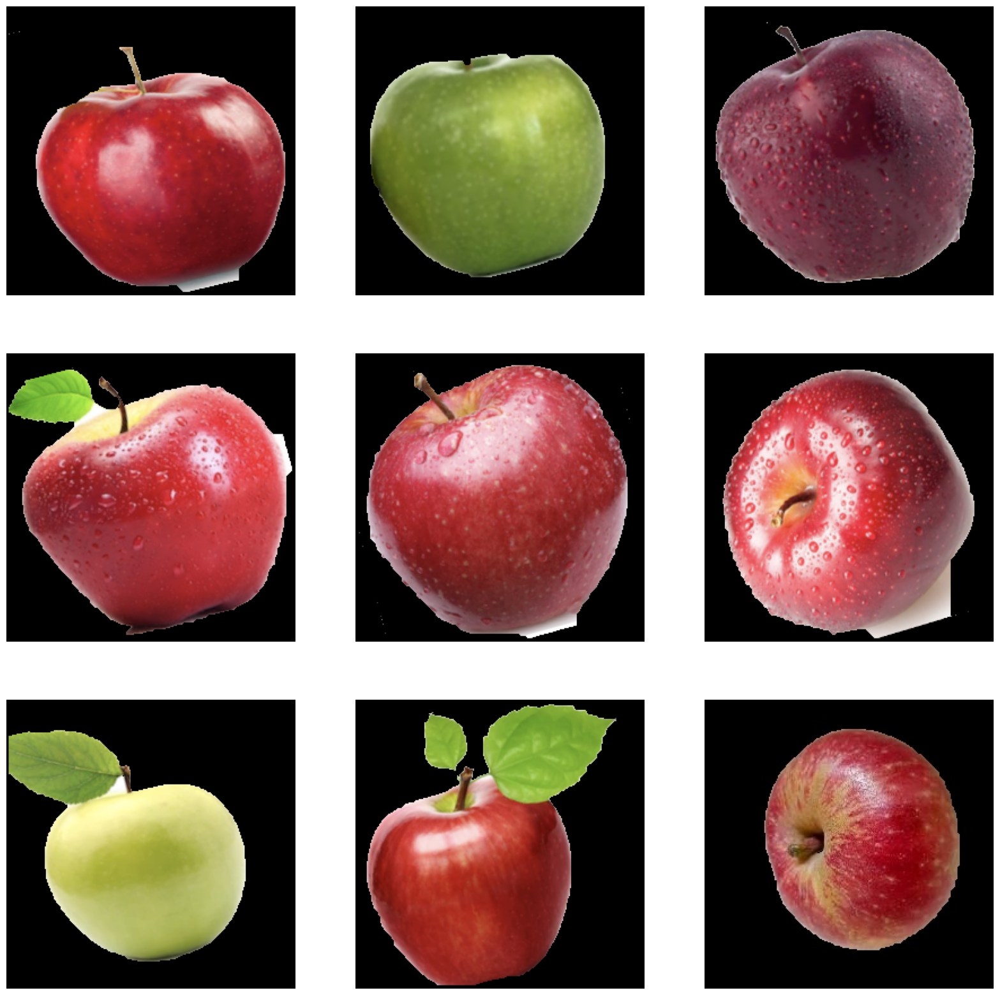

In [14]:
# Define the number of images to display
num_images_to_display = 9

# Initialize a counter to keep track of the displayed images
displayed_images = 0
plt.figure(figsize=(20, 20))

# Iterate through the directories and image files
for i in fruit_list:
    for j in os.listdir(os.path.join(data_dir_segment, i)):
        if displayed_images >= num_images_to_display:
            break
        
        image_path = os.path.join(data_dir_segment, i, j)
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Display the image
        plt.subplot(3, 3, displayed_images + 1)
        plt.imshow(image)
        plt.axis('off')
        
        displayed_images += 1

plt.show()

#### Mix Segmented & Initial Dataset

In [16]:
#Mix Segmented Image with Initial Image Dataset
for i in fruit_list:
    cnt = 500
    for k in os.listdir(os.path.join(data_dir_segment, i)):
        if cnt != 0:
            filename = os.path.join(data_dir_segment, i, k)
            new_filename = os.path.join(data_dir_fruit, i, k)
            image = cv2.imread(filename) 
            cv2.imwrite(new_filename, image)
            cnt -= 1
        else:
            break

#### Load Data

In [6]:
#DATA PIPELINE --> Get Data
data_fruit = tf.keras.preprocessing.image_dataset_from_directory(data_dir_fruit, image_size=img_size, batch_size=b_size, shuffle=True)

Found 17472 files belonging to 6 classes.


In [7]:
#Review Class In Data
data_fruit.class_names

['Fruits_apple_fresh',
 'Fruits_apple_rotten',
 'Fruits_banana_fresh',
 'Fruits_banana_rotten',
 'Fruits_orange_fresh',
 'Fruits_orange_rotten']

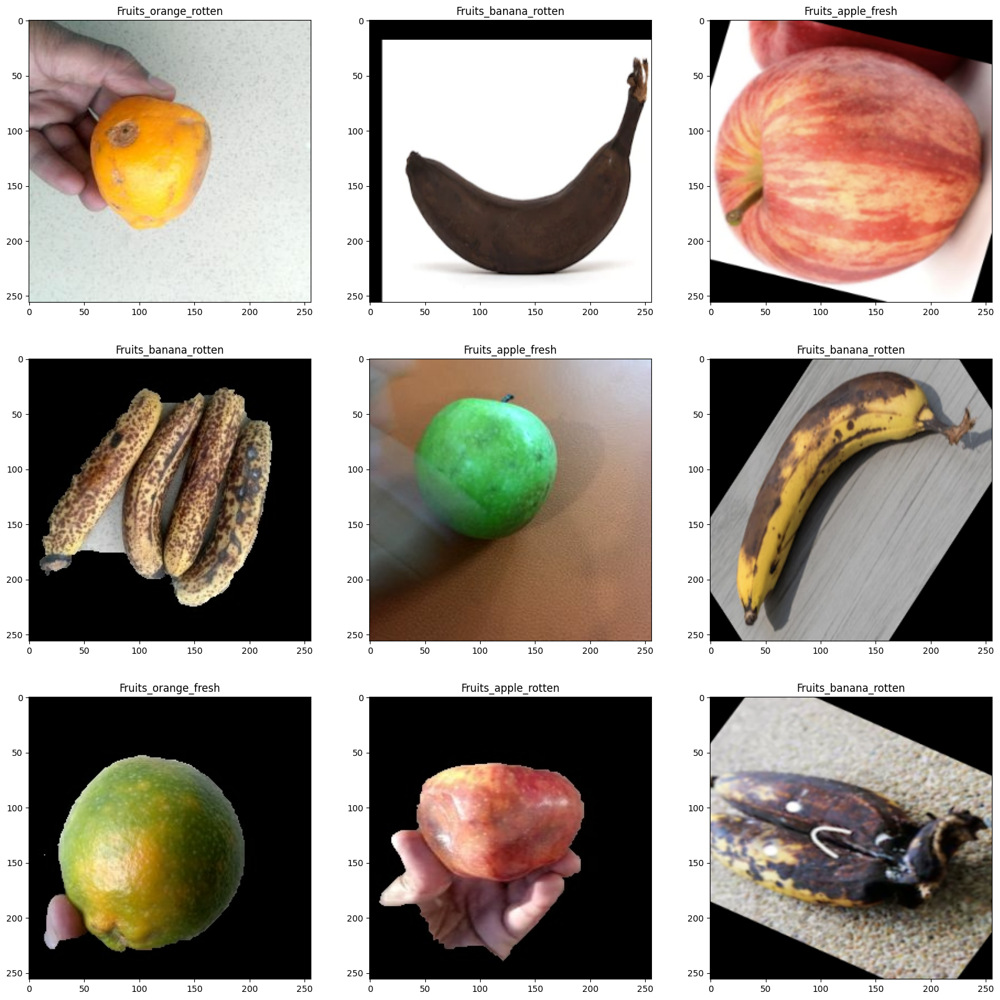

In [50]:
#Review Image in Dataset Fruit
plt.figure(figsize=(20, 20))
for images, labels in data_fruit.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(fruit_list[labels[i]])
        #plt.axis("off")

### Data Pre-Processing

#### Data Augmentation

In [8]:
# Image Augmentation
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.RandomFlip("horizontal"),
    tf.keras.layers.experimental.preprocessing.RandomFlip("vertical"),
    tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
    tf.keras.layers.experimental.preprocessing.RandomContrast(0.2),
])

# Apply Image Augmentation to Dataset
data_fruit = data_fruit.map(lambda x, y: (data_augmentation(x, training=True), y))

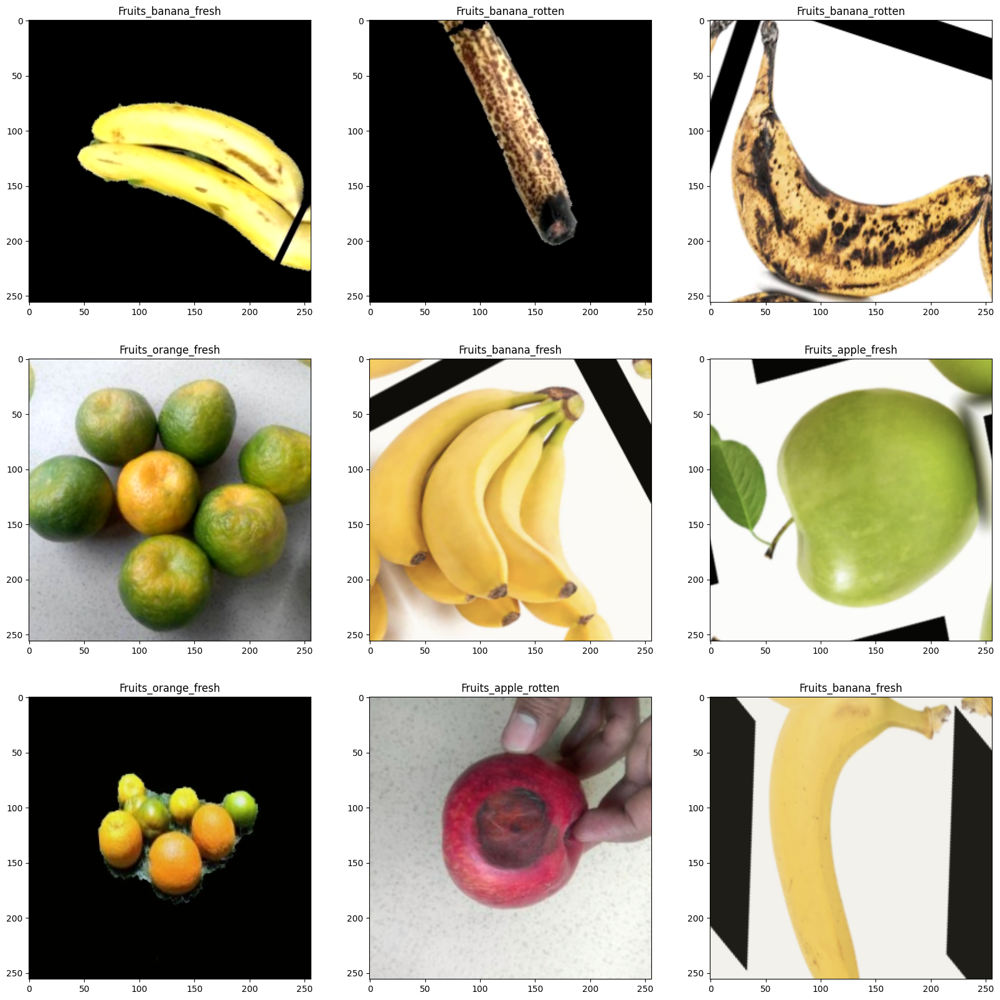

In [9]:
#Review Image in Dataset after CenterCrop
plt.figure(figsize=(20, 20))
for images, labels in data_fruit.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(fruit_list[labels[i]])
        #plt.axis("off")

#### Resizing & Rescaling (Normalization)

In [68]:
#Check Max & Min Scale
print('Data Fruit --> ', data_fruit.as_numpy_iterator().next()[0].min(), data_fruit.as_numpy_iterator().next()[0].max())

Data Fruit -->  0.0 255.0


In [9]:
# Image Augmentation
data_norm = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.Resizing(img_width, img_height),
    tf.keras.layers.experimental.preprocessing.Rescaling(1./255)
])

# Apply Image Augmentation to Dataset
data_fruit = data_fruit.map(lambda x, y: (data_norm(x, training=True), y))

In [22]:
for i in range(10):
#Check Max & Min Scale
    print('Data Fruit --> ', data_fruit.as_numpy_iterator().next()[0].min(), data_fruit.as_numpy_iterator().next()[0].max())

Data Fruit -->  0.0 1.0
Data Fruit -->  0.0 1.0
Data Fruit -->  0.0 1.0
Data Fruit -->  0.0 1.0
Data Fruit -->  0.0 1.0
Data Fruit -->  0.0 1.0
Data Fruit -->  0.0 1.0
Data Fruit -->  0.0 1.0
Data Fruit -->  0.0 1.0
Data Fruit -->  0.0 1.0


#### Split Data

In [10]:
#Check Data Batches
print('Data Fruit -- > ', len(data_fruit))

Data Fruit -- >  546


In [11]:
#Calculate & Set Split Amount
fruit_train  = int(train_size * len(data_fruit))
fruit_val = int(val_size * len(data_fruit))+1
fruit_test = int(test_size * len(data_fruit))+1

print('Fruit --> ', fruit_train, fruit_val, fruit_test, ( fruit_train + fruit_val + fruit_test))

Fruit -->  436 55 55 546


In [12]:
#Split Dataset
data_fruit_train = data_fruit.take(fruit_train)
data_fruit_val = data_fruit.skip(fruit_train).take(fruit_val)
data_fruit_test = data_fruit.skip(fruit_train + fruit_val).take(fruit_test)

print('Fruit --> ', len(data_fruit_train), len(data_fruit_val), len(data_fruit_test))

Fruit -->  436 55 55


In [13]:
#Autotune
AUTOTUNE = tf.data.experimental.AUTOTUNE

#Configure Dataset for Performance
data_fruit_train = data_fruit_train.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
data_fruit_val = data_fruit_val.cache().prefetch(buffer_size=AUTOTUNE)
data_fruit_test = data_fruit_test.cache().prefetch(buffer_size=AUTOTUNE)

print('Fruit --> ', len(data_fruit_train), len(data_fruit_val), len(data_fruit_test))

Fruit -->  436 55 55


In [14]:
#CHECK DATA SHAPE
test_element = data_fruit_test.take(1)
test_batch = next(iter(test_element))
print(test_batch[0].shape)  # Shape of the image batch
print(test_batch[1].shape)  # Shape of the labels batch

(32, 256, 256, 3)
(32,)


## 2.0 Model - CNN

### 2.1 Custom Model

#### 2.1.1  Custom Model - Build

In [10]:
def create_model():
    #Sequential Model
    fruit_model = tf.keras.Sequential()

    #Layers [Can Change, Depend on Architecture, Hyperparameter]
    #Input Layer --> Note: 32 = filter ||  (3,3) = pixel in size/kernel size || 1 = stripe  || relu = activation type
    fruit_model.add(Conv2D(16, (3, 3), strides = 1, padding ='same', activation='relu', input_shape=(img_width, img_height, 3))) 
    fruit_model.add(BatchNormalization())
    fruit_model.add(MaxPooling2D(2,2)) #Pooling to Condense Informations

    #Convolutional layers
    fruit_model.add(Conv2D(32, (3, 3), strides = 1, padding ='same', activation='relu'))
    fruit_model.add(BatchNormalization())
    fruit_model.add(MaxPooling2D(2,2))

    fruit_model.add(Conv2D(32, (3, 3), strides = 1, padding ='same', activation='relu'))
    fruit_model.add(BatchNormalization())
    fruit_model.add(MaxPooling2D(2,2))

    fruit_model.add(Conv2D(32, (3, 3), strides = 1, padding ='same', activation='relu'))
    fruit_model.add(BatchNormalization())
    fruit_model.add(MaxPooling2D(2,2))

    #Flatten Layer --> Flatten the output from convolutional layers
    fruit_model.add(Flatten())

    #Fully Connected Layer --> Dense Layer
    fruit_model.add(Dense(128, activation='relu'))
    fruit_model.add(BatchNormalization())
    fruit_model.add(Dropout(0.5))

    #Output Layer --> sigmoid for binary, softmax for multi class
    fruit_model.add(Dense(fruit_num, activation='softmax')) 

    #Compile Model --> Note: Adam as Optimizer
    initial_learning_rate = 0.001
    fruit_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=initial_learning_rate), loss="sparse_categorical_crossentropy", metrics=['accuracy'])
    
    return fruit_model

In [11]:
fruit_model = create_model()

In [12]:
#Display Model Summary
fruit_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 256, 256, 16)      448       
                                                                 
 batch_normalization (BatchN  (None, 256, 256, 16)     64        
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 128, 128, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 32)      4640      
                                                                 
 batch_normalization_1 (Batc  (None, 128, 128, 32)     128       
 hNormalization)                                                 
                                                      

#### 2.1.2 Custom Model -  Train 

In [30]:
#TensorBoard Logs =--> Check Points to Check How Model Perform
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir = fruit_logdir)

#Early Stopping
# from tensorflow.keras.callbacks import EarlyStopping
# early_stopping = EarlyStopping(monitor='val_accuracy', patience=2, restore_best_weights=True)

#Model Checkpoint
from tensorflow.keras.callbacks import ModelCheckpoint
model_cp = ModelCheckpoint(os.path.join(model_dir, cnn_fruit_cp), monitor='val_accuracy', verbose = 1, save_best_only=True, mode='max')

In [31]:
#Run Model (Train) --> epochs = how long train will run... 1 epochs = 1 full run (all batches)
history_fruit = fruit_model.fit(data_fruit_train, epochs=epochs, validation_data=data_fruit_val, callbacks=[tensorboard_callback, model_cp])

Epoch 1/40
436/436 [==============================] - ETA: 0s - loss: 0.7540 - accuracy: 0.7461
Epoch 1: val_accuracy improved from -inf to 0.65511, saving model to models\CNN-FRUIT-Epoch-01.h5
436/436 [==============================] - 163s 219ms/step - loss: 0.7540 - accuracy: 0.7461 - val_loss: 0.8703 - val_accuracy: 0.6551
Epoch 2/40
436/436 [==============================] - ETA: 0s - loss: 0.3961 - accuracy: 0.8574
Epoch 2: val_accuracy improved from 0.65511 to 0.88807, saving model to models\CNN-FRUIT-Epoch-02.h5
436/436 [==============================] - 43s 98ms/step - loss: 0.3961 - accuracy: 0.8574 - val_loss: 0.3089 - val_accuracy: 0.8881
Epoch 3/40
436/436 [==============================] - ETA: 0s - loss: 0.3141 - accuracy: 0.8882
Epoch 3: val_accuracy did not improve from 0.88807
436/436 [==============================] - 23s 54ms/step - loss: 0.3141 - accuracy: 0.8882 - val_loss: 0.4900 - val_accuracy: 0.8381
Epoch 4/40
435/436 [============================>.] - ETA: 0s

Epoch 29/40
436/436 [==============================] - ETA: 0s - loss: 0.0280 - accuracy: 0.9901
Epoch 29: val_accuracy did not improve from 0.95511
436/436 [==============================] - 22s 50ms/step - loss: 0.0280 - accuracy: 0.9901 - val_loss: 0.2174 - val_accuracy: 0.9540
Epoch 30/40
435/436 [============================>.] - ETA: 0s - loss: 0.0276 - accuracy: 0.9907
Epoch 30: val_accuracy did not improve from 0.95511
436/436 [==============================] - 22s 51ms/step - loss: 0.0276 - accuracy: 0.9907 - val_loss: 0.2261 - val_accuracy: 0.9483
Epoch 31/40
436/436 [==============================] - ETA: 0s - loss: 0.0173 - accuracy: 0.9945
Epoch 31: val_accuracy did not improve from 0.95511
436/436 [==============================] - 22s 51ms/step - loss: 0.0173 - accuracy: 0.9945 - val_loss: 0.1728 - val_accuracy: 0.9523
Epoch 32/40
436/436 [==============================] - ETA: 0s - loss: 0.0238 - accuracy: 0.9917
Epoch 32: val_accuracy improved from 0.95511 to 0.95739, 

In [32]:
#Print History
history_fruit.history

{'loss': [0.7540257573127747,
  0.396147757768631,
  0.3141069710254669,
  0.2598704993724823,
  0.21311599016189575,
  0.17644397914409637,
  0.1423645317554474,
  0.12948913872241974,
  0.10429041087627411,
  0.09001236408948898,
  0.08488284051418304,
  0.06576388329267502,
  0.06624317914247513,
  0.06539877504110336,
  0.05551483854651451,
  0.0496661514043808,
  0.03922083228826523,
  0.030120335519313812,
  0.039949771016836166,
  0.04371815174818039,
  0.029197324067354202,
  0.03645580634474754,
  0.03559648245573044,
  0.029508864507079124,
  0.03108114004135132,
  0.030621256679296494,
  0.02894558757543564,
  0.0251767598092556,
  0.027975454926490784,
  0.027586201205849648,
  0.01728859357535839,
  0.023839525878429413,
  0.013367051258683205,
  0.01998651772737503,
  0.03150860592722893,
  0.015294634737074375,
  0.019877910614013672,
  0.015312484465539455,
  0.02048116736114025,
  0.02086942084133625],
 'accuracy': [0.74612957239151,
  0.8573681116104126,
  0.888188064

In [33]:
#Model History in Dataframe
history_fruit_df = pd.DataFrame(history_fruit.history)
history_fruit_df

,loss,accuracy,val_loss,val_accuracy
0,0.754026,0.746130,0.870347,0.655114
1,0.396148,0.857368,0.308914,0.888068
2,0.314107,0.888188,0.489975,0.838068
3,0.259870,0.907397,0.644312,0.814773
4,0.213116,0.926677,0.253507,0.918750
5,0.176444,0.937142,0.221537,0.917614
6,0.142365,0.950903,0.239030,0.921591
7,0.129489,0.953268,0.402402,0.869318
8,0.104290,0.962299,0.432284,0.865341
9,0.090012,0.968033,0.188335,0.935227


#### 2.1.3 Custom Model - Evaluate 

##### 2.1.3.1 Plot Performance

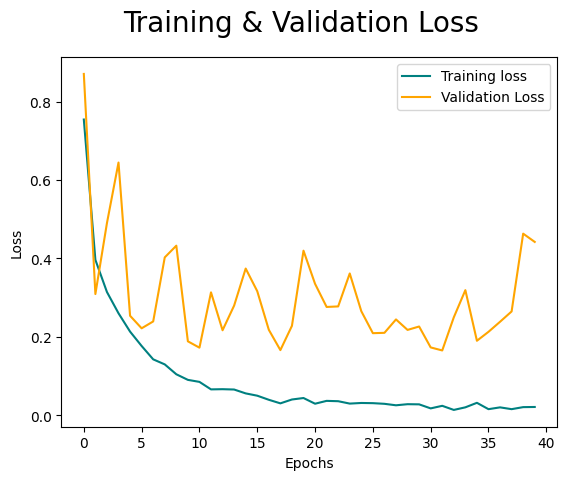

In [34]:
#Model Loss Plot
fig = plt.figure()
plt.plot(history_fruit.history['loss'], color='teal', label ='loss')
plt.plot(history_fruit.history['val_loss'], color='orange', label ='val_loss')
fig.suptitle('Training & Validation Loss', fontsize=20)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['Training loss','Validation Loss'], loc = 'upper right')
plt.show()

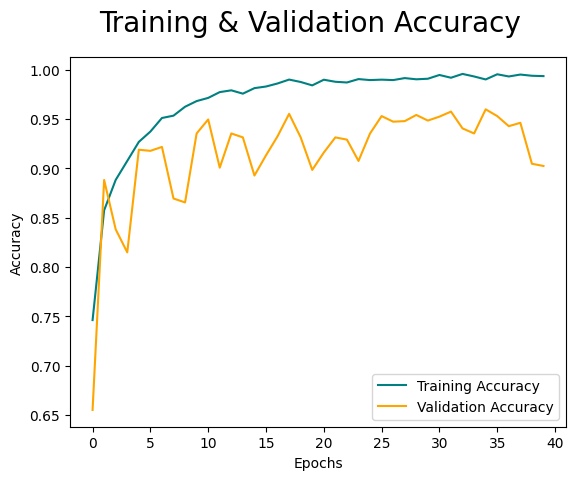

In [35]:
#Model Accuracy Plot
fig = plt.figure()
plt.plot(history_fruit.history['accuracy'], color='teal', label ='accuracy')
plt.plot(history_fruit.history['val_accuracy'], color='orange', label ='val_accuracy')
fig.suptitle('Training & Validation Accuracy', fontsize=20)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(['Training Accuracy','Validation Accuracy'], loc = 'lower right')
plt.show()

##### 2.1.3.2 Metrics

In [74]:
#Evaluate Model with Test Data
loss, acc = fruit_model.evaluate(data_fruit_test)
print('Accuracy Test: ',acc)
print('Loss Test: ',loss)

55/55 [==============================] - 72s 159ms/step - loss: 0.3932 - accuracy: 0.9222
Accuracy Test:  0.9221590757369995
Loss Test:  0.39324504137039185


##### 2.1.3.3 Classification Report

In [75]:
#Classification Report --> Using Test Data
from sklearn.metrics import classification_report
test_images = []
test_labels = []

for images, labels in data_fruit_test:
    test_images.extend(images.numpy())
    test_labels.extend(labels.numpy())

test_images = np.array(test_images)
test_labels = np.array(test_labels)

predictions = np.argmax(fruit_model.predict(data_fruit_test), axis=-1)

predicted_class_names = [fruit_list[label] for label in predictions]
true_class_names = [fruit_list[label] for label in test_labels]
report = classification_report(true_class_names, predicted_class_names)
print(report)

55/55 [==============================] - 1s 21ms/step
                      precision    recall  f1-score   support

  Fruits_apple_fresh       0.93      0.86      0.90       272
 Fruits_apple_rotten       0.90      0.92      0.91       353
 Fruits_banana_fresh       0.94      0.99      0.97       277
Fruits_banana_rotten       0.97      0.98      0.97       346
 Fruits_orange_fresh       0.89      0.90      0.89       245
Fruits_orange_rotten       0.89      0.86      0.88       267

            accuracy                           0.92      1760
           macro avg       0.92      0.92      0.92      1760
        weighted avg       0.92      0.92      0.92      1760



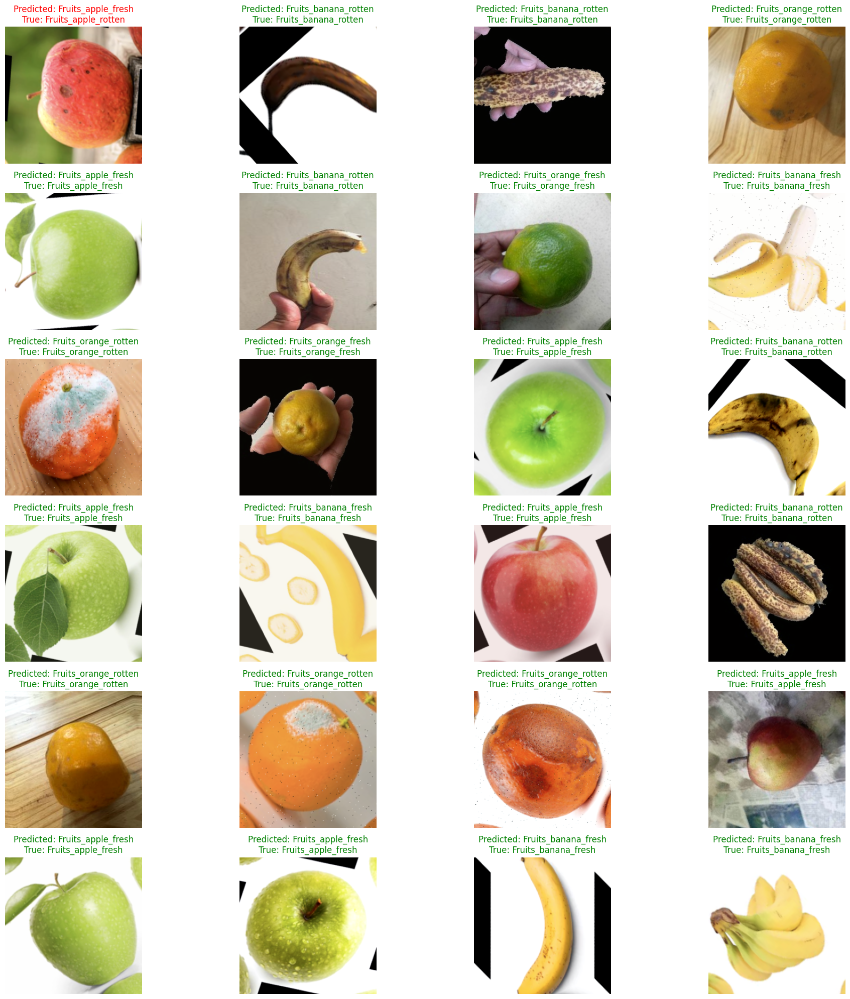

In [20]:
#Test Sample
plt.figure(figsize=(20, 20))
for i in range(24):
    ax = plt.subplot(6, 4, i + 1)
    plt.imshow(test_images[i])
    if predicted_class_names[i] == true_class_names[i]:
        plt.title(f"Predicted: {predicted_class_names[i]}\nTrue: {true_class_names[i]}", color='green')
    else:
        plt.title(f"Predicted: {predicted_class_names[i]}\nTrue: {true_class_names[i]}", color='red')
    plt.axis("off")
plt.tight_layout()
plt.show()

##### 2.1.3.4 Confusion Matrix

55/55 [==============================] - 1s 20ms/step


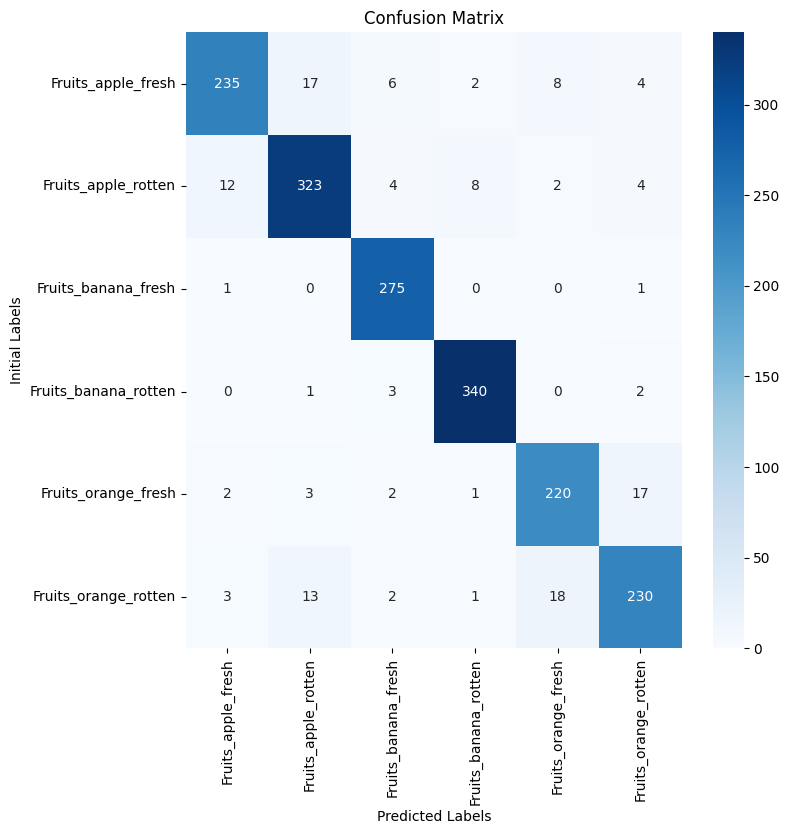

In [76]:
#Confusion Matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns
test_images = []
test_labels = []
for images, labels in data_fruit_test:
    test_images.extend(images.numpy())
    test_labels.extend(labels.numpy())
test_images = np.array(test_images)
test_labels = np.array(test_labels)
test_predictions = np.argmax(fruit_model.predict(data_fruit_test), axis=-1)

# Create the confusion matrix
cm = confusion_matrix(test_labels, test_predictions)

# Plot the confusion matrix
plt.figure(figsize=(8, 8))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=fruit_list, yticklabels=fruit_list)
plt.xlabel("Predicted Labels")
plt.ylabel("Initial Labels")
plt.title("Confusion Matrix")
plt.show()

#### Cross Validation

In [15]:
#Early Stopping
from tensorflow.keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='loss', patience=2, restore_best_weights=False)

# Define lists to store evaluation metrics
validation_losses = []
validation_accuracies = []

# Define the number of folds
k = 5

# Get the total number of samples in your dataset
num_samples = len(data_fruit)

# Calculate the number of samples in each fold
fold_size = num_samples // k

# Shuffle the data
data_fruit= data_fruit.shuffle(num_samples, reshuffle_each_iteration=False)

# Perform k-fold cross-validation
for fold in range(k):
    print(f"Processing fold {fold + 1}/{k}")
    
    # Determine the starting and ending indices for the current fold
    start_idx = fold * fold_size
    end_idx = (fold + 1) * fold_size if fold < k - 1 else num_samples

    # Split the data into training and validation sets for the current fold
    validation_data = data_fruit.skip(start_idx).take(fold_size)
    training_data = data_fruit.take(start_idx).concatenate(data_fruit.skip(end_idx))

    # Define and compile your model
    model = create_model()  # Replace with your own model creation function
    
    # Train the model on the training data
    model.fit(training_data, epochs=epochs, callbacks=[early_stopping])
    
    # Evaluate the model on the validation data
    validation_loss, validation_accuracy = model.evaluate(validation_data)
    validation_losses.append(validation_loss)
    validation_accuracies.append(validation_accuracy)
    print(f"\nValidation Loss: {validation_loss:.4f}")
    print(f"Validation Accuracy: {validation_accuracy:.4f}\n")


# Calculate the overall metrics
overall_loss = np.mean(validation_losses)
overall_accuracy = np.mean(validation_accuracies)

print("Overall Metrics")
print(f"Overall Loss: {overall_loss:.4f}")
print(f"Overall Accuracy: {overall_accuracy:.4f}")


Processing fold 1/5
Epoch 1/40
437/437 [==============================] - 114s 70ms/step - loss: 0.7528 - accuracy: 0.7481
Epoch 2/40
437/437 [==============================] - 100s 65ms/step - loss: 0.4512 - accuracy: 0.8440
Epoch 3/40
437/437 [==============================] - 98s 57ms/step - loss: 0.3630 - accuracy: 0.8729
Epoch 4/40
437/437 [==============================] - 97s 57ms/step - loss: 0.3222 - accuracy: 0.8869
Epoch 5/40
437/437 [==============================] - 96s 55ms/step - loss: 0.2812 - accuracy: 0.9007
Epoch 6/40
437/437 [==============================] - 96s 57ms/step - loss: 0.2637 - accuracy: 0.9078
Epoch 7/40
437/437 [==============================] - 96s 57ms/step - loss: 0.3016 - accuracy: 0.8970
Epoch 8/40
437/437 [==============================] - 96s 57ms/step - loss: 0.2335 - accuracy: 0.9210
Epoch 9/40
437/437 [==============================] - 96s 57ms/step - loss: 0.2155 - accuracy: 0.9259
Epoch 10/40
437/437 [==============================] - 96s 

Processing fold 1/5
Epoch 1/40
437/437 [==============================] - 114s 70ms/step - loss: 0.7528 - accuracy: 0.7481
Epoch 2/40
437/437 [==============================] - 100s 65ms/step - loss: 0.4512 - accuracy: 0.8440
Epoch 3/40
437/437 [==============================] - 98s 57ms/step - loss: 0.3630 - accuracy: 0.8729
Epoch 4/40
437/437 [==============================] - 97s 57ms/step - loss: 0.3222 - accuracy: 0.8869
Epoch 5/40
437/437 [==============================] - 96s 55ms/step - loss: 0.2812 - accuracy: 0.9007
Epoch 6/40
437/437 [==============================] - 96s 57ms/step - loss: 0.2637 - accuracy: 0.9078
Epoch 7/40
437/437 [==============================] - 96s 57ms/step - loss: 0.3016 - accuracy: 0.8970
Epoch 8/40
437/437 [==============================] - 96s 57ms/step - loss: 0.2335 - accuracy: 0.9210
Epoch 9/40
437/437 [==============================] - 96s 57ms/step - loss: 0.2155 - accuracy: 0.9259
Epoch 10/40
437/437 [==============================] - 96s 5

### 2.2 VGG16

#### 2.2.1  VGG16  - Build

In [16]:
def create_model_1():
    vgg16_model = tf.keras.applications.VGG16(input_shape=(img_width, img_height, 3), include_top=False)

    # Freeze Layers
    for layer in vgg16_model.layers:
        layer.trainable = False

    # Add Fully Connected Layers
    x = Flatten()(vgg16_model.output)
    x = Dense(128, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)

    # Output Layer
    output = Dense(fruit_num, activation='softmax')(x)

    # Create the model
    vgg16_model = tf.keras.Model(inputs=vgg16_model.input, outputs=output)

    # Compile the model
    initial_learning_rate = 0.001
    vgg16_model.compile(optimizer=Adam(learning_rate=initial_learning_rate), loss="sparse_categorical_crossentropy", metrics=['accuracy'])
    
    return vgg16_model

In [17]:
vgg16_model = create_model_1()

In [18]:
#Display Model Summary
vgg16_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

#### 2.2.2  VGG16  - Train

In [22]:
#TensorBoard Logs =--> Check Points to Check How Model Perform
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir = fruit_logdir)

#Early Stopping
# from tensorflow.keras.callbacks import EarlyStopping
# early_stopping = EarlyStopping(monitor='val_accuracy', patience=2, restore_best_weights=True)

#Model Checkpoint
from tensorflow.keras.callbacks import ModelCheckpoint
model_cp = ModelCheckpoint(os.path.join(model_dir, cnn_fruit_vgg16_cp), monitor='val_accuracy', verbose = 1, save_best_only=True, mode='max')

In [23]:
#Run Model (Train) --> epochs = how long train will run... 1 epochs = 1 full run (all batches)
vgg16_history = vgg16_model.fit(data_fruit_train, epochs=epochs, validation_data=data_fruit_val, callbacks=[tensorboard_callback,  model_cp])

Epoch 1/40
436/436 [==============================] - ETA: 0s - loss: 0.4881 - accuracy: 0.8263
Epoch 1: val_accuracy improved from -inf to 0.92386, saving model to models\CNN-FRUIT-VGG16-Epoch-01.h5
436/436 [==============================] - 252s 403ms/step - loss: 0.4881 - accuracy: 0.8263 - val_loss: 0.2333 - val_accuracy: 0.9239
Epoch 2/40
436/436 [==============================] - ETA: 0s - loss: 0.1875 - accuracy: 0.9398
Epoch 2: val_accuracy improved from 0.92386 to 0.93750, saving model to models\CNN-FRUIT-VGG16-Epoch-02.h5
436/436 [==============================] - 121s 277ms/step - loss: 0.1875 - accuracy: 0.9398 - val_loss: 0.1745 - val_accuracy: 0.9375
Epoch 3/40
436/436 [==============================] - ETA: 0s - loss: 0.1098 - accuracy: 0.9662
Epoch 3: val_accuracy did not improve from 0.93750
436/436 [==============================] - 109s 250ms/step - loss: 0.1098 - accuracy: 0.9662 - val_loss: 0.1901 - val_accuracy: 0.9330
Epoch 4/40
436/436 [=========================

Epoch 29/40
436/436 [==============================] - ETA: 0s - loss: 0.0193 - accuracy: 0.9938
Epoch 29: val_accuracy did not improve from 0.96136
436/436 [==============================] - 107s 246ms/step - loss: 0.0193 - accuracy: 0.9938 - val_loss: 0.1979 - val_accuracy: 0.9494
Epoch 30/40
436/436 [==============================] - ETA: 0s - loss: 0.0197 - accuracy: 0.9933
Epoch 30: val_accuracy did not improve from 0.96136
436/436 [==============================] - 107s 246ms/step - loss: 0.0197 - accuracy: 0.9933 - val_loss: 0.2285 - val_accuracy: 0.9494
Epoch 31/40
436/436 [==============================] - ETA: 0s - loss: 0.0165 - accuracy: 0.9943
Epoch 31: val_accuracy did not improve from 0.96136
436/436 [==============================] - 107s 246ms/step - loss: 0.0165 - accuracy: 0.9943 - val_loss: 0.1769 - val_accuracy: 0.9511
Epoch 32/40
436/436 [==============================] - ETA: 0s - loss: 0.0143 - accuracy: 0.9953
Epoch 32: val_accuracy improved from 0.96136 to 0.9

In [24]:
#Print History
vgg16_history.history

{'loss': [0.48812565207481384,
  0.18751788139343262,
  0.10980813950300217,
  0.08756212890148163,
  0.06876450031995773,
  0.059032924473285675,
  0.050612516701221466,
  0.050448786467313766,
  0.04828812554478645,
  0.05079967528581619,
  0.04902561753988266,
  0.035409316420555115,
  0.028021294623613358,
  0.03317037597298622,
  0.03207813575863838,
  0.03484693914651871,
  0.026156077161431313,
  0.02577919512987137,
  0.02086237445473671,
  0.023565858602523804,
  0.017607834190130234,
  0.02421504817903042,
  0.024221397936344147,
  0.019906220957636833,
  0.019376005977392197,
  0.01789383962750435,
  0.014502176083624363,
  0.021396620199084282,
  0.019293706864118576,
  0.019748108461499214,
  0.016509169712662697,
  0.014321227557957172,
  0.012276951223611832,
  0.012522365897893906,
  0.01402770821005106,
  0.012811706401407719,
  0.012150782160460949,
  0.016096064820885658,
  0.014295382425189018,
  0.01606789231300354],
 'accuracy': [0.8262614607810974,
  0.9397935867

In [25]:
#Model History in Dataframe
vgg16_history_df = pd.DataFrame(vgg16_history.history)
vgg16_history_df

,loss,accuracy,val_loss,val_accuracy
0,0.488126,0.826261,0.233336,0.923864
1,0.187518,0.939794,0.174540,0.937500
2,0.109808,0.966241,0.190084,0.932955
3,0.087562,0.974054,0.182128,0.932955
4,0.068765,0.979501,0.127007,0.952273
5,0.059033,0.982010,0.151613,0.951705
6,0.050613,0.985378,0.153386,0.957955
7,0.050449,0.983443,0.172641,0.942045
8,0.048288,0.985163,0.137310,0.955114
9,0.050800,0.982511,0.153327,0.950568


#### 2.2.3 VGG16  - Evaluate

##### 2.2.3.1 Plot Performance

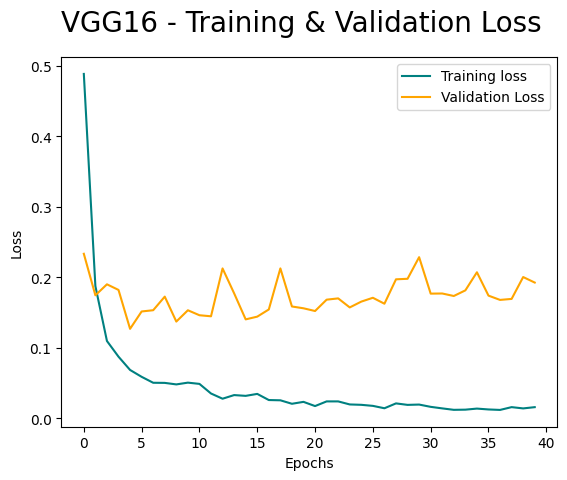

In [26]:
#Model Loss Plot
fig = plt.figure()
plt.plot(vgg16_history.history['loss'], color='teal', label ='loss')
plt.plot(vgg16_history.history['val_loss'], color='orange', label ='val_loss')
fig.suptitle('VGG16 - Training & Validation Loss', fontsize=20)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['Training loss','Validation Loss'], loc = 'upper right')
plt.show()

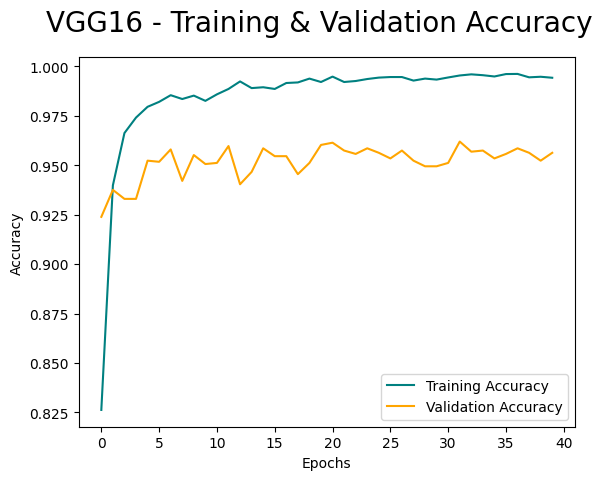

In [27]:
#Model Accuracy Plot
fig = plt.figure()
plt.plot(vgg16_history.history['accuracy'], color='teal', label ='accuracy')
plt.plot(vgg16_history.history['val_accuracy'], color='orange', label ='val_accuracy')
fig.suptitle('VGG16 - Training & Validation Accuracy', fontsize=20)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(['Training Accuracy','Validation Accuracy'], loc = 'lower right')
plt.show()

##### 2.2.3.2 Metrics

In [61]:
#Evaluate Model with Test Data
loss, acc = vgg16_model.evaluate(data_fruit_test)
print('Accuracy Test: ',acc)
print('Loss Test: ',loss)

55/55 [==============================] - 13s 224ms/step - loss: 0.2873 - accuracy: 0.9341
Accuracy Test:  0.9340909123420715
Loss Test:  0.2872637212276459


##### 2.1.4.3 Classification Report

In [62]:
#Classification Report --> Usinng Test Data
from sklearn.metrics import classification_report
test_images = []
test_labels = []

for images, labels in data_fruit_test:
    test_images.extend(images.numpy())
    test_labels.extend(labels.numpy())

test_images = np.array(test_images)
test_labels = np.array(test_labels)

predictions = np.argmax(vgg16_model.predict(data_fruit_test), axis=-1)

predicted_class_names = [fruit_list[label] for label in predictions]
true_class_names = [fruit_list[label] for label in test_labels]
report = classification_report(true_class_names, predicted_class_names)
print(report)

55/55 [==============================] - 13s 225ms/step
                      precision    recall  f1-score   support

  Fruits_apple_fresh       0.88      0.94      0.91       261
 Fruits_apple_rotten       0.94      0.94      0.94       349
 Fruits_banana_fresh       0.99      0.94      0.96       279
Fruits_banana_rotten       0.95      0.99      0.97       324
 Fruits_orange_fresh       0.91      0.89      0.90       264
Fruits_orange_rotten       0.93      0.89      0.91       283

            accuracy                           0.93      1760
           macro avg       0.93      0.93      0.93      1760
        weighted avg       0.93      0.93      0.93      1760



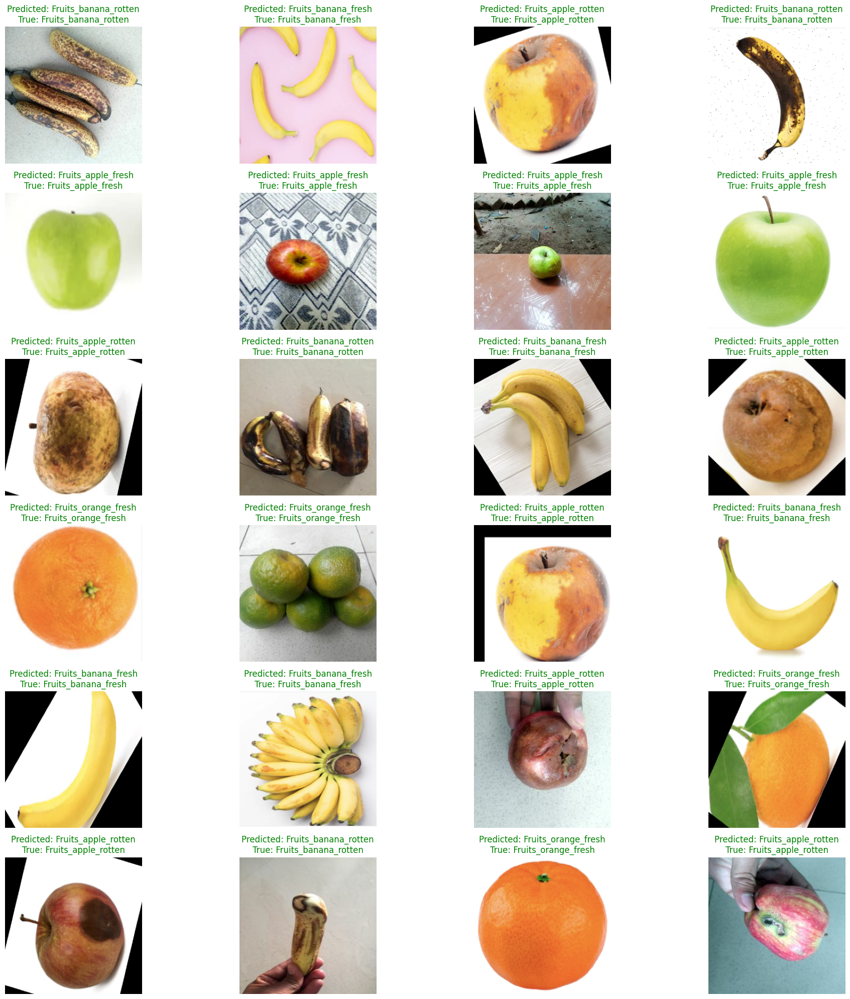

In [61]:
#Test Sample
plt.figure(figsize=(20, 20))
for i in range(24):
    ax = plt.subplot(6, 4, i + 1)
    plt.imshow(test_images[i])
    if predicted_class_names[i] == true_class_names[i]:
        plt.title(f"Predicted: {predicted_class_names[i]}\nTrue: {true_class_names[i]}", color='green')
    else:
        plt.title(f"Predicted: {predicted_class_names[i]}\nTrue: {true_class_names[i]}", color='red')
    plt.axis("off")
plt.tight_layout()
plt.show()

##### 2.1.4.3 Confusion Matrix

55/55 [==============================] - 12s 227ms/step


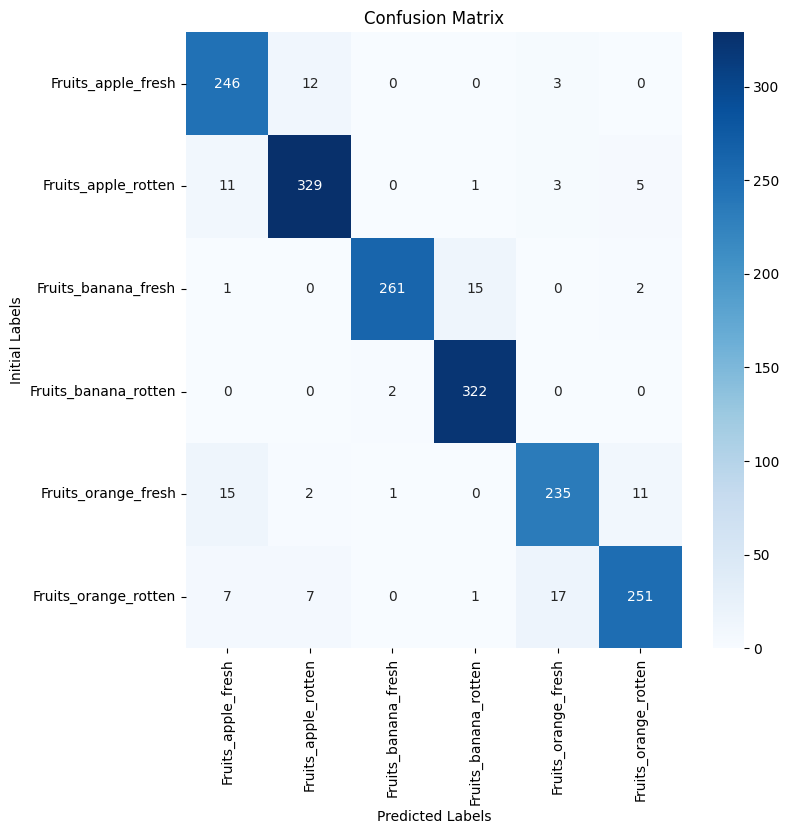

In [64]:
#Confusion Matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns
test_images = []
test_labels = []
for images, labels in data_fruit_test:
    test_images.extend(images.numpy())
    test_labels.extend(labels.numpy())
test_images = np.array(test_images)
test_labels = np.array(test_labels)
test_predictions = np.argmax(vgg16_model.predict(data_fruit_test), axis=-1)

cm = confusion_matrix(test_labels, test_predictions)
# Plot the confusion matrix
plt.figure(figsize=(8, 8))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=fruit_list, yticklabels=fruit_list)
plt.xlabel("Predicted Labels")
plt.ylabel("Initial Labels")
plt.title("Confusion Matrix")
plt.show()

#### Cross Validation

In [19]:
#Early Stopping
from tensorflow.keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='loss', patience=2, restore_best_weights=False)

# Define lists to store evaluation metrics
validation_losses = []
validation_accuracies = []

# Define the number of folds
k = 5

# Get the total number of samples in your dataset
num_samples = len(data_fruit)

# Calculate the number of samples in each fold
fold_size = num_samples // k

# Shuffle the data
data_fruit= data_fruit.shuffle(num_samples, reshuffle_each_iteration=False)

# Perform k-fold cross-validation
for fold in range(k):
    print(f"Processing fold {fold + 1}/{k}")
    
    # Determine the starting and ending indices for the current fold
    start_idx = fold * fold_size
    end_idx = (fold + 1) * fold_size if fold < k - 1 else num_samples

    # Split the data into training and validation sets for the current fold
    validation_data = data_fruit.skip(start_idx).take(fold_size)
    training_data = data_fruit.take(start_idx).concatenate(data_fruit.skip(end_idx))

    # Define and compile your model
    model = create_model_1()  # Replace with your own model creation function
    
    # Train the model on the training data
    model.fit(training_data, epochs=epochs, callbacks=[early_stopping])
    
    # Evaluate the model on the validation data
    validation_loss, validation_accuracy = model.evaluate(validation_data)
    validation_losses.append(validation_loss)
    validation_accuracies.append(validation_accuracy)
    print(f"\nValidation Loss: {validation_loss:.4f}")
    print(f"Validation Accuracy: {validation_accuracy:.4f}\n")


# Calculate the overall metrics
overall_loss = np.mean(validation_losses)
overall_accuracy = np.mean(validation_accuracies)

print("Overall Metrics")
print(f"Overall Loss: {overall_loss:.4f}")
print(f"Overall Accuracy: {overall_accuracy:.4f}")

Processing fold 1/5
Epoch 1/40
437/437 [==============================] - 186s 224ms/step - loss: 0.4952 - accuracy: 0.8277
Epoch 2/40
437/437 [==============================] - 179s 224ms/step - loss: 0.2522 - accuracy: 0.9145
Epoch 3/40
437/437 [==============================] - 176s 223ms/step - loss: 0.2075 - accuracy: 0.9303
Epoch 4/40
437/437 [==============================] - 174s 221ms/step - loss: 0.1797 - accuracy: 0.9384
Epoch 5/40
437/437 [==============================] - 175s 221ms/step - loss: 0.1703 - accuracy: 0.9434
Epoch 6/40
437/437 [==============================] - 175s 222ms/step - loss: 0.1586 - accuracy: 0.9476
Epoch 7/40
437/437 [==============================] - 174s 221ms/step - loss: 0.1316 - accuracy: 0.9558
Epoch 8/40
437/437 [==============================] - 177s 224ms/step - loss: 0.1374 - accuracy: 0.9533
Epoch 9/40
437/437 [==============================] - 180s 224ms/step - loss: 0.1271 - accuracy: 0.9575
Epoch 10/40
437/437 [=======================

### 2.3 ResNet50

#### 2.3.1  ResNet50  - Build

In [14]:
def create_model_2():
    resnet50_model = ResNet50(pooling ='avg', include_top=False, input_shape=(img_width, img_height, 3))

    # Freeze Layers
    for layer in resnet50_model.layers:
        layer.trainable = False

    # Add custom layers on top of ResNet50
    x = Flatten()(resnet50_model.output)
    x = Dense(128, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)

    # Output Layer
    output = Dense(fruit_num, activation='softmax')(x)

    # Create the model
    resnet50_model = tf.keras.Model(inputs=resnet50_model.input, outputs=output)


    # Compile Model
    initial_learning_rate = 0.001
    resnet50_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=initial_learning_rate), loss="sparse_categorical_crossentropy", metrics=['accuracy'])
    return resnet50_model

In [15]:
resnet50_model = create_model_2()

In [16]:
#Display Model Summary
resnet50_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

                                                                                                  
 conv2_block3_1_relu (Activatio  (None, 64, 64, 64)  0           ['conv2_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_block3_2_conv (Conv2D)   (None, 64, 64, 64)   36928       ['conv2_block3_1_relu[0][0]']    
                                                                                                  
 conv2_block3_2_bn (BatchNormal  (None, 64, 64, 64)  256         ['conv2_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block3_2_relu (Activatio  (None, 64, 64, 64)  0           ['conv2_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv3_block3_1_relu (Activatio  (None, 32, 32, 128)  0          ['conv3_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block3_2_conv (Conv2D)   (None, 32, 32, 128)  147584      ['conv3_block3_1_relu[0][0]']    
                                                                                                  
 conv3_block3_2_bn (BatchNormal  (None, 32, 32, 128)  512        ['conv3_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block3_2_relu (Activatio  (None, 32, 32, 128)  0          ['conv3_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv4_block2_1_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block2_1_relu (Activatio  (None, 16, 16, 256)  0          ['conv4_block2_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block2_2_conv (Conv2D)   (None, 16, 16, 256)  590080      ['conv4_block2_1_relu[0][0]']    
                                                                                                  
 conv4_block2_2_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block2_2_conv[0][0]']    
 ization) 

 conv4_block5_1_conv (Conv2D)   (None, 16, 16, 256)  262400      ['conv4_block4_out[0][0]']       
                                                                                                  
 conv4_block5_1_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block5_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block5_1_relu (Activatio  (None, 16, 16, 256)  0          ['conv4_block5_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block5_2_conv (Conv2D)   (None, 16, 16, 256)  590080      ['conv4_block5_1_relu[0][0]']    
                                                                                                  
 conv4_blo

                                                                  'conv5_block1_3_bn[0][0]']      
                                                                                                  
 conv5_block1_out (Activation)  (None, 8, 8, 2048)   0           ['conv5_block1_add[0][0]']       
                                                                                                  
 conv5_block2_1_conv (Conv2D)   (None, 8, 8, 512)    1049088     ['conv5_block1_out[0][0]']       
                                                                                                  
 conv5_block2_1_bn (BatchNormal  (None, 8, 8, 512)   2048        ['conv5_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block2_1_relu (Activatio  (None, 8, 8, 512)   0           ['conv5_block2_1_bn[0][0]']      
 n)       

#### 2.3.2  ResNet50  - Train

In [17]:
#TensorBoard Logs =--> Check Points to Check How Model Perform
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir = fruit_logdir)

#Early Stopping
# from tensorflow.keras.callbacks import EarlyStopping
# early_stopping = EarlyStopping(monitor='val_accuracy', patience=2, restore_best_weights=True)

#Model Checkpoint
from tensorflow.keras.callbacks import ModelCheckpoint
model_cp = ModelCheckpoint(os.path.join(model_dir, cnn_fruit_res50_cp), monitor='val_accuracy', verbose = 1, save_best_only=True, mode='max')

In [18]:
#Run Model (Train) --> epochs = how long train will run... 1 epochs = 1 full run (all batches)
res50_history = resnet50_model.fit(data_fruit_train, epochs=epochs, validation_data=data_fruit_val, callbacks=[tensorboard_callback, model_cp])

Epoch 1/40
436/436 [==============================] - ETA: 0s - loss: 1.5285 - accuracy: 0.3944
Epoch 1: val_accuracy improved from -inf to 0.25341, saving model to models\CNN-FRUIT-RESNET50-Epoch-01.h5
436/436 [==============================] - 230s 352ms/step - loss: 1.5285 - accuracy: 0.3944 - val_loss: 2.1318 - val_accuracy: 0.2534
Epoch 2/40
436/436 [==============================] - ETA: 0s - loss: 1.2826 - accuracy: 0.5086
Epoch 2: val_accuracy improved from 0.25341 to 0.25398, saving model to models\CNN-FRUIT-RESNET50-Epoch-02.h5
436/436 [==============================] - 90s 207ms/step - loss: 1.2826 - accuracy: 0.5086 - val_loss: 2.9894 - val_accuracy: 0.2540
Epoch 3/40
436/436 [==============================] - ETA: 0s - loss: 1.2157 - accuracy: 0.5416
Epoch 3: val_accuracy did not improve from 0.25398
436/436 [==============================] - 75s 173ms/step - loss: 1.2157 - accuracy: 0.5416 - val_loss: 4.5644 - val_accuracy: 0.2330
Epoch 4/40
436/436 [=====================

436/436 [==============================] - 75s 171ms/step - loss: 0.9697 - accuracy: 0.6379 - val_loss: 1.4762 - val_accuracy: 0.4693
Epoch 29/40
436/436 [==============================] - ETA: 0s - loss: 0.9758 - accuracy: 0.6377
Epoch 29: val_accuracy did not improve from 0.50966
436/436 [==============================] - 75s 171ms/step - loss: 0.9758 - accuracy: 0.6377 - val_loss: 1.4582 - val_accuracy: 0.4818
Epoch 30/40
436/436 [==============================] - ETA: 0s - loss: 0.9734 - accuracy: 0.6401
Epoch 30: val_accuracy did not improve from 0.50966
436/436 [==============================] - 75s 171ms/step - loss: 0.9734 - accuracy: 0.6401 - val_loss: 2.2000 - val_accuracy: 0.3125
Epoch 31/40
436/436 [==============================] - ETA: 0s - loss: 0.9693 - accuracy: 0.6383
Epoch 31: val_accuracy did not improve from 0.50966
436/436 [==============================] - 75s 171ms/step - loss: 0.9693 - accuracy: 0.6383 - val_loss: 2.1187 - val_accuracy: 0.4392
Epoch 32/40
436/4

In [19]:
#Print History
res50_history.history

{'loss': [1.5285197496414185,
  1.2825654745101929,
  1.2157330513000488,
  1.167904019355774,
  1.1383261680603027,
  1.1203526258468628,
  1.0997002124786377,
  1.0844186544418335,
  1.0858179330825806,
  1.0845701694488525,
  1.0637469291687012,
  1.0439292192459106,
  1.0360654592514038,
  1.0352171659469604,
  1.0215513706207275,
  1.0112357139587402,
  1.0031145811080933,
  1.0008968114852905,
  0.9930170178413391,
  0.9871465563774109,
  0.9900779128074646,
  0.9931443333625793,
  0.9797250628471375,
  0.9777998328208923,
  0.9746297001838684,
  0.9715133309364319,
  0.9679213166236877,
  0.969732940196991,
  0.9757909774780273,
  0.9733830690383911,
  0.9693410992622375,
  0.9777455925941467,
  0.9801174402236938,
  0.9967184662818909,
  0.9805334210395813,
  0.9745864868164062,
  0.974638819694519,
  0.9672601222991943,
  0.9652026295661926,
  0.9639719724655151],
 'accuracy': [0.3944237530231476,
  0.5086008906364441,
  0.5416427850723267,
  0.5597047209739685,
  0.5711008906

In [20]:
#Model History in Dataframe
res50_history_df = pd.DataFrame(res50_history.history)
res50_history_df

,loss,accuracy,val_loss,val_accuracy
0,1.528520,0.394424,2.131803,0.253409
1,1.282565,0.508601,2.989383,0.253977
2,1.215733,0.541643,4.564358,0.232955
3,1.167904,0.559705,4.265970,0.291477
4,1.138326,0.571101,3.807720,0.316477
5,1.120353,0.582067,3.011590,0.215341
6,1.099700,0.585364,4.675794,0.301705
7,1.084419,0.595112,4.382337,0.186932
8,1.085818,0.595470,2.017310,0.326705
9,1.084570,0.598982,2.307915,0.356250


#### 2.3.3  ResNet50  - Evaluate

##### 2.3.3.1 Plot Performance

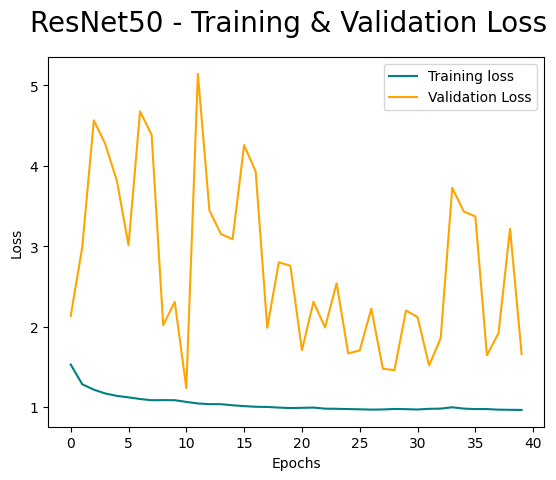

In [21]:
#Model Loss Plot
fig = plt.figure()
plt.plot(res50_history.history['loss'], color='teal', label ='loss')
plt.plot(res50_history.history['val_loss'], color='orange', label ='val_loss')
fig.suptitle('ResNet50 - Training & Validation Loss', fontsize=20)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['Training loss','Validation Loss'], loc = 'upper right')
plt.show()

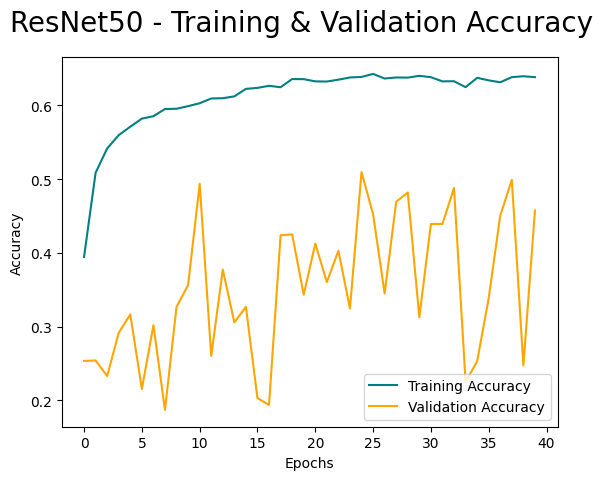

In [22]:
#Model Accuracy Plot
fig = plt.figure()
plt.plot(res50_history.history['accuracy'], color='teal', label ='accuracy')
plt.plot(res50_history.history['val_accuracy'], color='orange', label ='val_accuracy')
fig.suptitle('ResNet50 - Training & Validation Accuracy', fontsize=20)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(['Training Accuracy','Validation Accuracy'], loc = 'lower right')
plt.show()

##### 2.3.3.2 Metrics

In [23]:
#Evaluate Model with Test Data
loss, acc = resnet50_model.evaluate(data_fruit_test)
print('Accuracy Test: ',acc)
print('Loss Test: ',loss)

55/55 [==============================] - 85s 255ms/step - loss: 1.6637 - accuracy: 0.5119
Accuracy Test:  0.511931836605072
Loss Test:  1.6636964082717896


##### 2.3.3.1 Classfication Report

In [24]:
#Classification Report --> Usinng Test Data
from sklearn.metrics import classification_report
test_images = []
test_labels = []

for images, labels in data_fruit_test:
    test_images.extend(images.numpy())
    test_labels.extend(labels.numpy())

test_images = np.array(test_images)
test_labels = np.array(test_labels)

predictions = np.argmax(resnet50_model.predict(data_fruit_test), axis=-1)

predicted_class_names = [fruit_list[label] for label in predictions]
true_class_names = [fruit_list[label] for label in test_labels]
report = classification_report(true_class_names, predicted_class_names)
print(report)

55/55 [==============================] - 10s 150ms/step
                      precision    recall  f1-score   support

  Fruits_apple_fresh       0.00      0.00      0.00       275
 Fruits_apple_rotten       0.68      0.48      0.56       368
 Fruits_banana_fresh       0.82      0.62      0.71       260
Fruits_banana_rotten       0.53      0.97      0.68       339
 Fruits_orange_fresh       0.32      0.86      0.47       247
Fruits_orange_rotten       0.81      0.08      0.15       271

            accuracy                           0.51      1760
           macro avg       0.53      0.50      0.43      1760
        weighted avg       0.54      0.51      0.44      1760



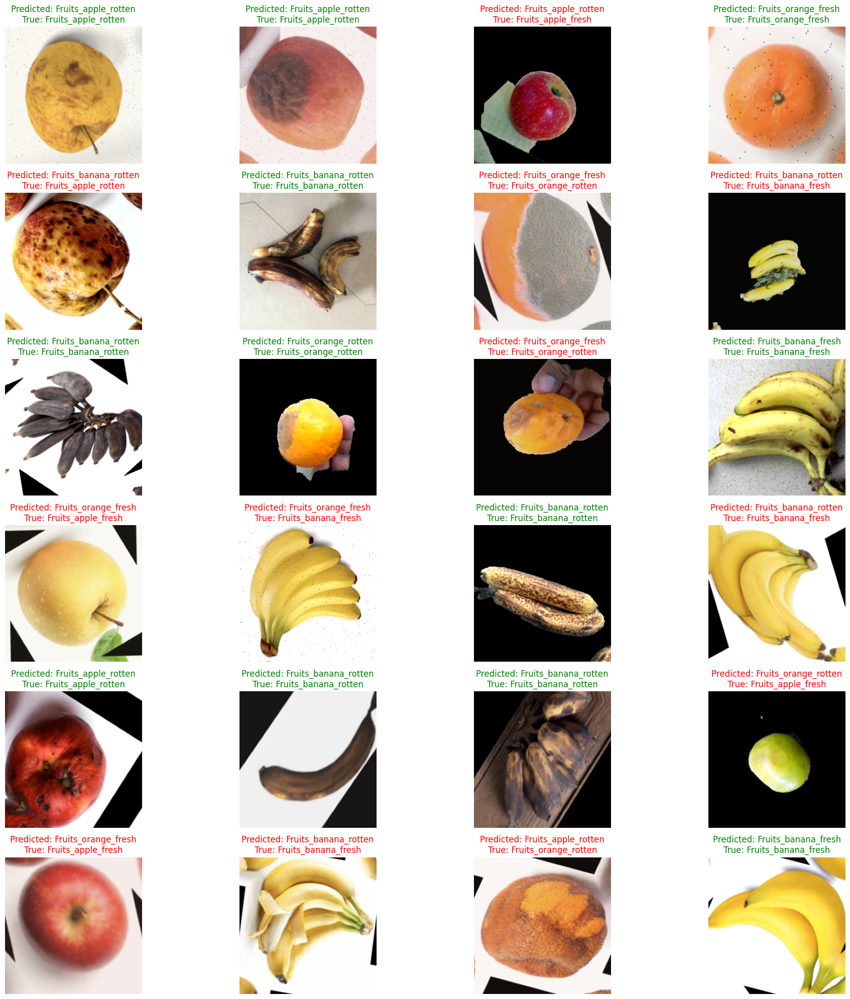

In [25]:
#Test Sample
plt.figure(figsize=(20, 20))
for i in range(24):
    ax = plt.subplot(6, 4, i + 1)
    plt.imshow(test_images[i])
    if predicted_class_names[i] == true_class_names[i]:
        plt.title(f"Predicted: {predicted_class_names[i]}\nTrue: {true_class_names[i]}", color='green')
    else:
        plt.title(f"Predicted: {predicted_class_names[i]}\nTrue: {true_class_names[i]}", color='red')
    plt.axis("off")
plt.tight_layout()
plt.show()

##### 2.3.3.1 Confusion Matrix

55/55 [==============================] - 8s 147ms/step


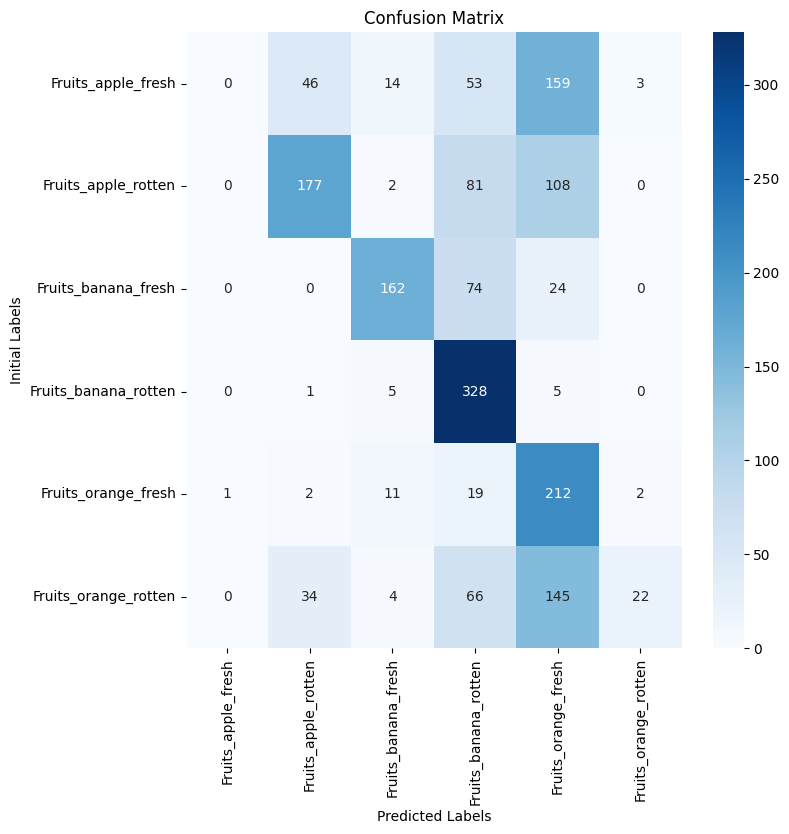

In [26]:
#Confusion Matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns
test_images = []
test_labels = []
for images, labels in data_fruit_test:
    test_images.extend(images.numpy())
    test_labels.extend(labels.numpy())
test_images = np.array(test_images)
test_labels = np.array(test_labels)
test_predictions = np.argmax(resnet50_model.predict(data_fruit_test), axis=-1)

cm = confusion_matrix(test_labels, test_predictions)
# Plot the confusion matrix
plt.figure(figsize=(8, 8))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=fruit_list, yticklabels=fruit_list)
plt.xlabel("Predicted Labels")
plt.ylabel("Initial Labels")
plt.title("Confusion Matrix")
plt.show()

## 3.0 Save Model

In [163]:
#Save model
from tensorflow.keras.models import load_model
fruit_model.save(os.path.join(model_dir, cnn_fruit))
vgg16_model.save(os.path.join(model_dir, cnn_fruit_vgg16))
resnet50_model.save(os.path.join(model_dir, cnn_fruit_res50))

## 4.0 Load Model

In [164]:
#Load Model
from tensorflow.keras.models import load_model
loaded_model = load_model(os.path.join(model_dir, cnn_fruit))
loaded_model_1 = load_model(os.path.join(model_dir, cnn_fruit_vgg16))
loaded_model_2 = load_model(os.path.join(model_dir, cnn_fruit_res50))